Q1-B

*** عکس خروجی ها داخل فایل pdf شده هستش ***

در این قسمت ما باید دوباره تشخیص چهره انجام میدادیم اما این بار این کار را با استفاده از روش پی سی ای انجام میدادیم. برای اینکه بتوانیم این کار را انجام بدهیم باید ابتدا ماتریس کوواریانس را حساب کنیم که مطابق درسی که استاد داد سر کلاس باید میانگین را ابتدا پیدا کنیم و از ماتریسی که در حال حاضر در اختیار داریم کم میکنیم تا ماتریسی ایجاد شود که میانگین آن صفر باشد. سپس این ماتریس جدید را در ترانهاده ی خود ضرب میکنیم و بر تعداد ستون ها منهای ۱ تقسیم میکنیم. سپس  مقدار کا را مشخص میکنیم تا بفهمیم که چه تعداد از بردار ها ی ویژه را در نظر بگیریم. پس از این کار باید ماتریس جدیدی را که بدست آوردیم با بقیه ی عکس ها مقایسه شود تا بهترین عکس پیدا شود. برای این کار ابتدا عکس را بازسازی میکنیم. یعنی با استفاده از میانگین و ماتریسی که از پی‌سی‌ای بدست آوردیم ماتریس جدیدی را درست میکنیم. بعد از ساخت مجدد ماتریس ما این ماتریس جدید را با باقی عکس ها یا بهتره بگوییم باقی ماتریس ها مقایسه میکنیم. این مقایسه مشابه قسمت اول خواهد بود یعنی ماتریس ها را کم کرده و سپس نرم میگیریم. سپس مقادیر بدست آمده را در یک ماتریس نگه میداریم و پس از سورت کردن این مقادیر کوچک ترین آنها را انتخاب میکنیم. و آن را چاپ میکنیم. برای مشخص کردن دقت هم مشابه بخش اول ما یک متغیر درنظر میگیریم که با هر بار اشتباه تشخیص دادن یکی به مقدار آن اضافه میشود. در نهایت این مقدار را بر تعداد کل فایل ها ی داخل دایرکتوری تقسیم میکنیم و مقدار خطا را بدست می آوریم. 

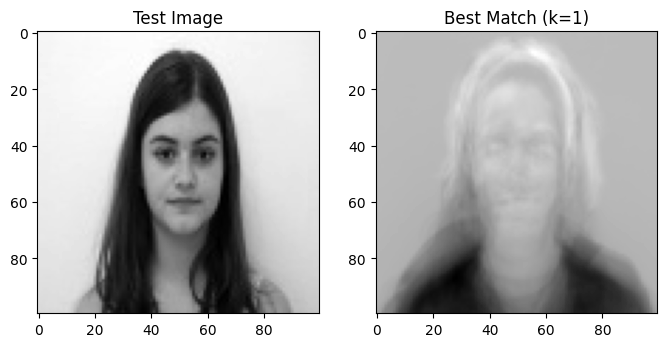

0
1


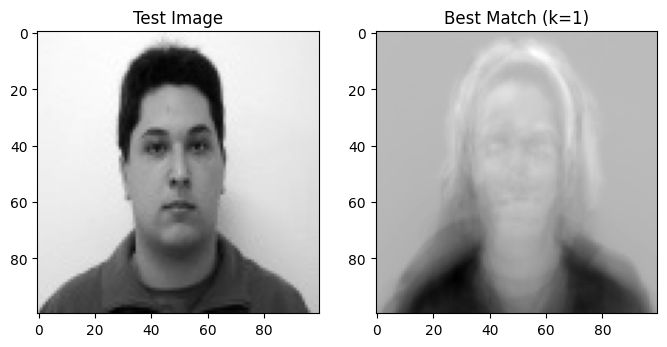

1
1


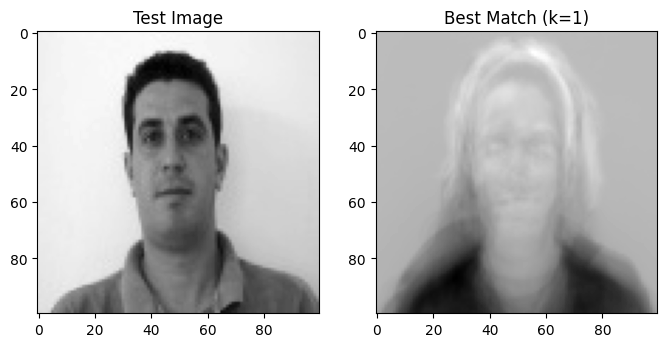

1
2


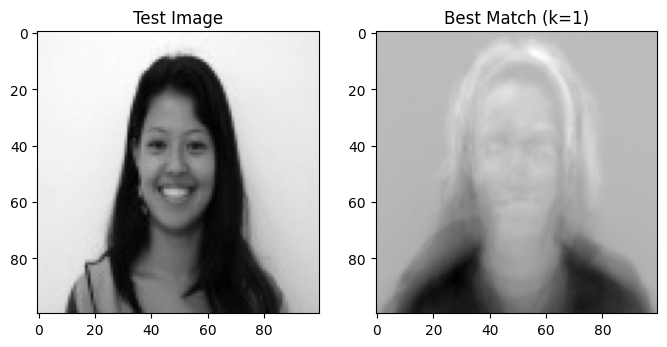

2
2


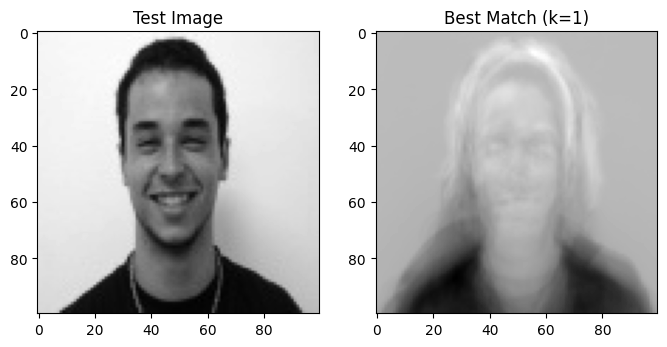

2
3


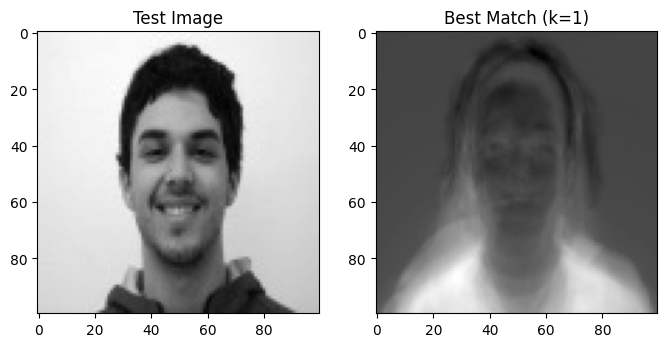

3
3


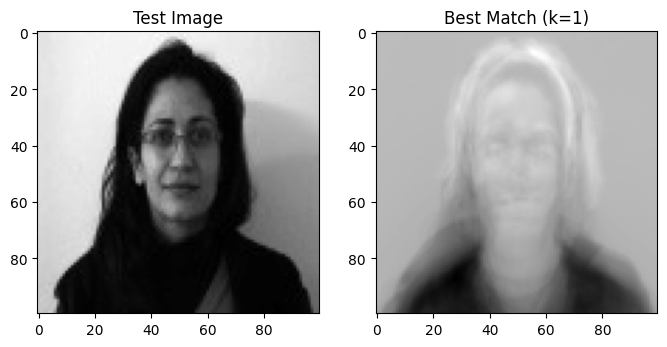

3
4


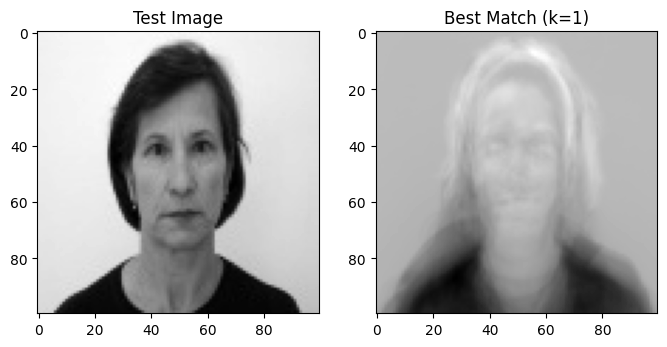

3
5


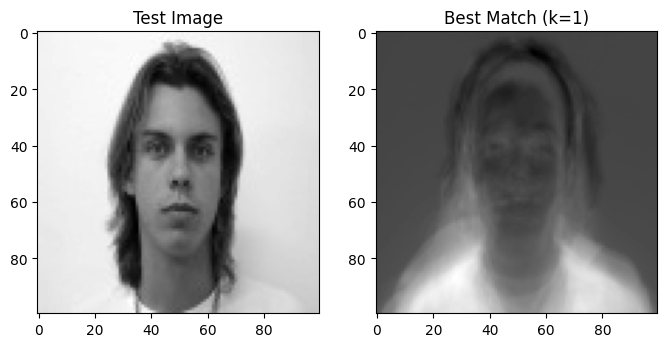

3
6


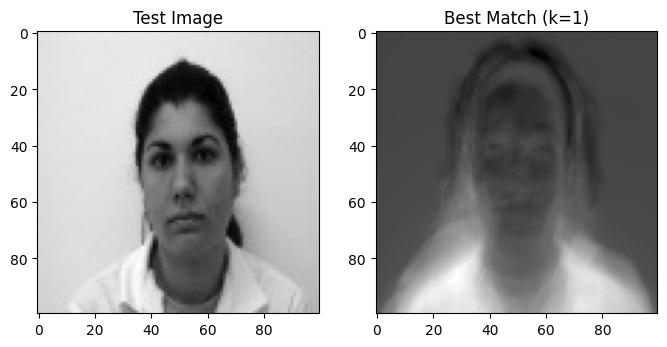

4
6


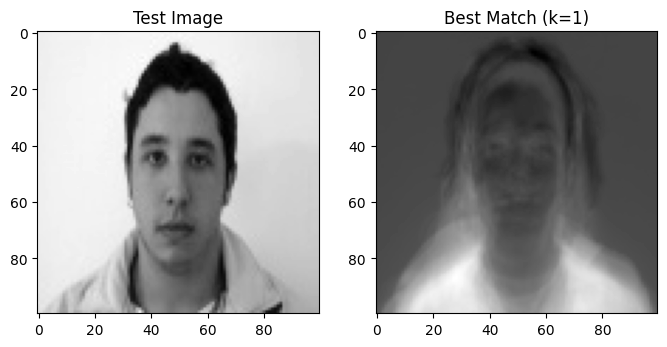

4
7


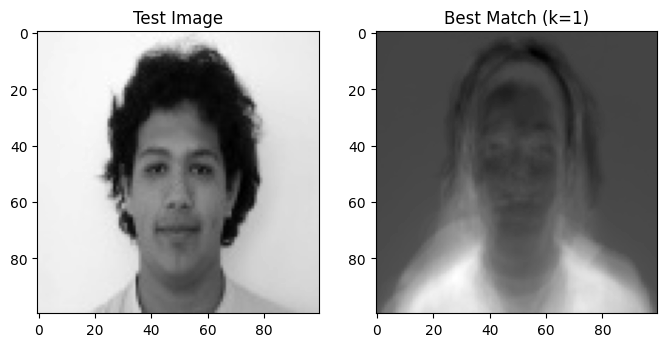

5
7


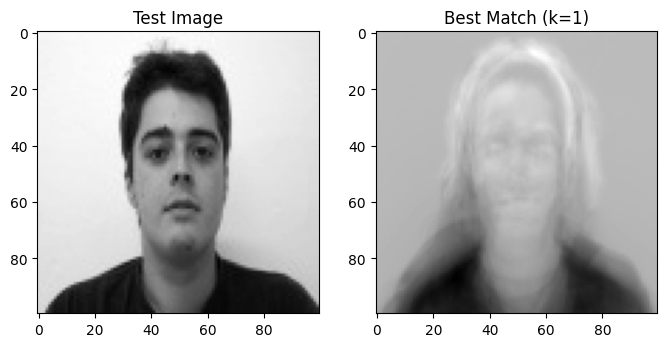

5
8


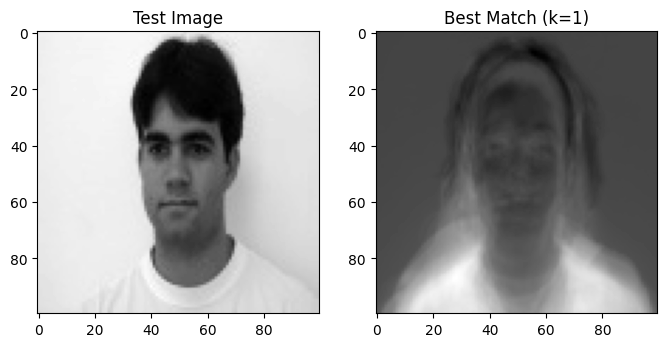

5
9


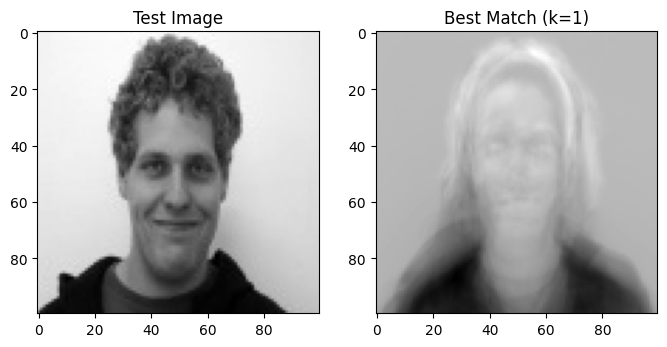

5
10


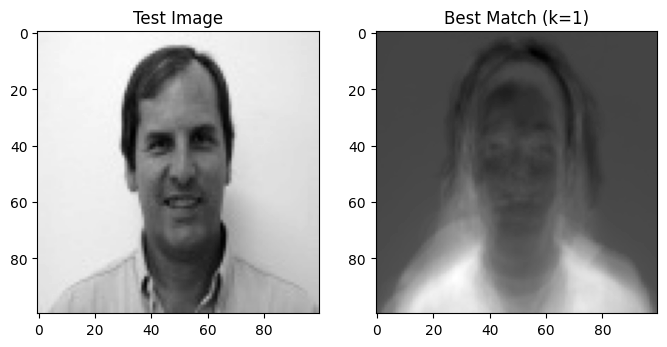

6
10


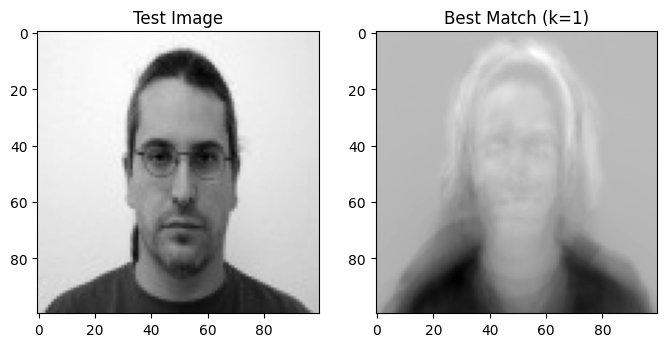

6
11


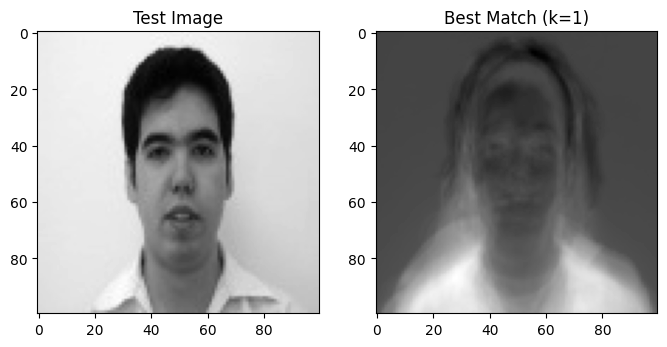

7
11


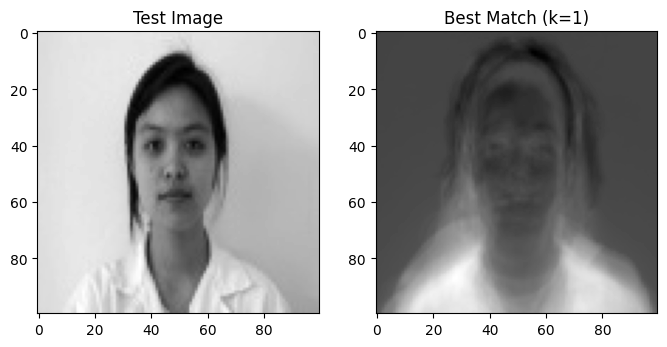

7
12


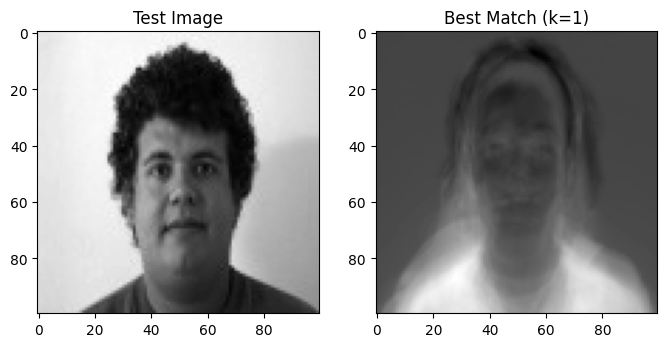

7
13


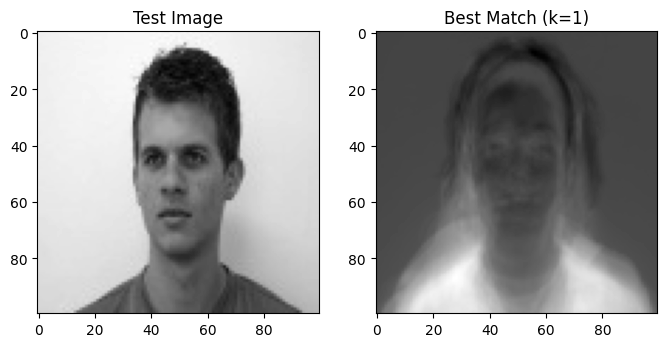

7
14


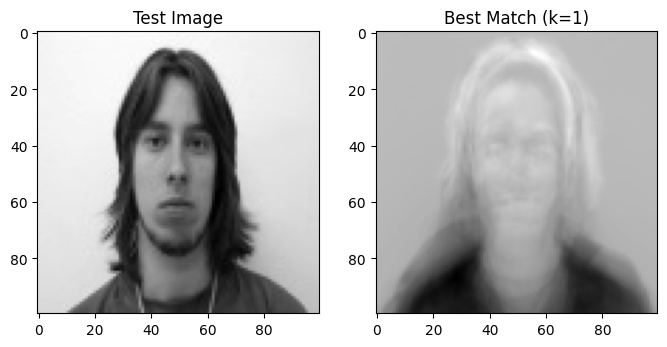

8
14


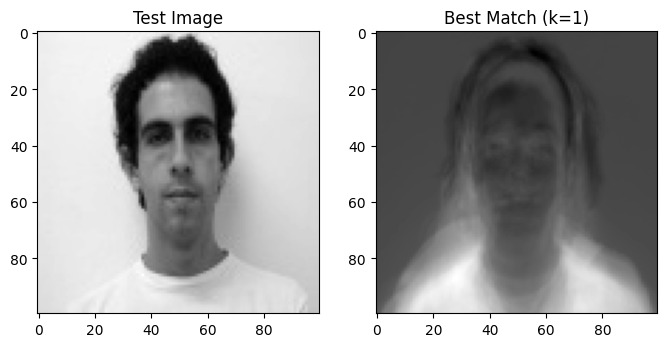

9
14


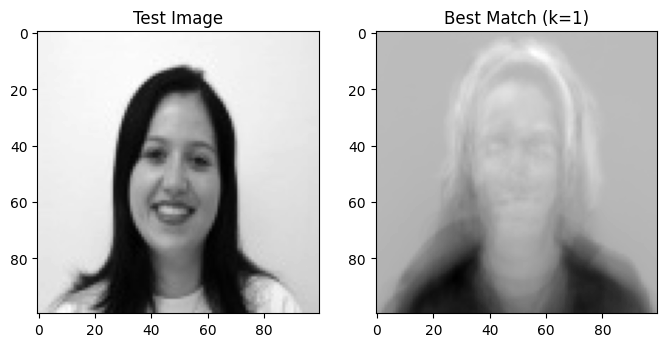

9
15


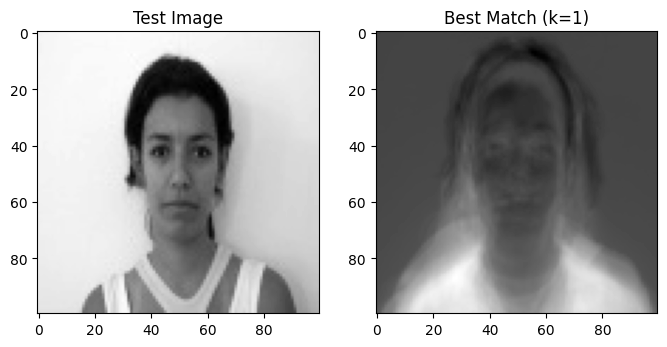

10
15


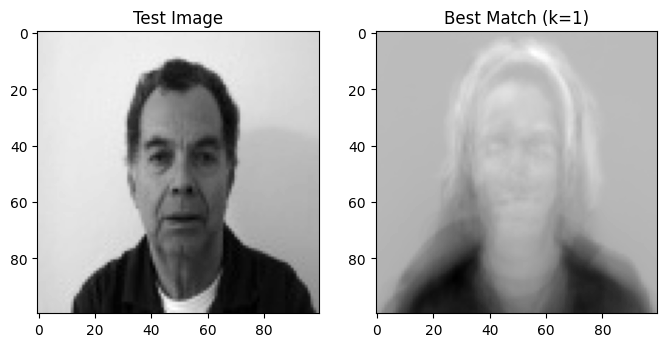

10
16


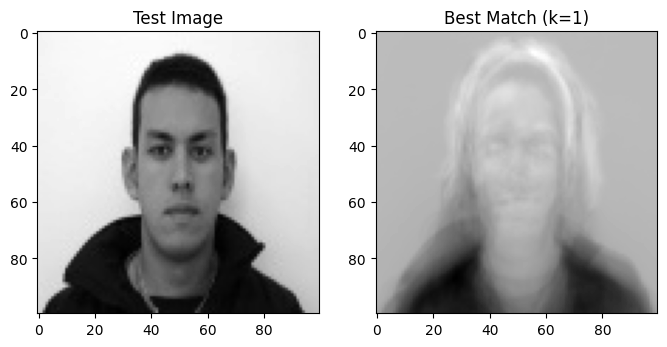

11
16


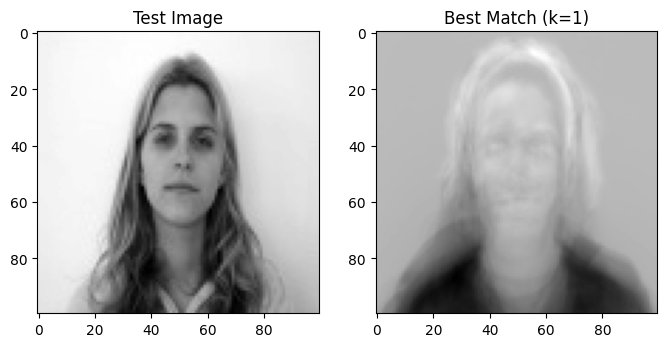

12
16


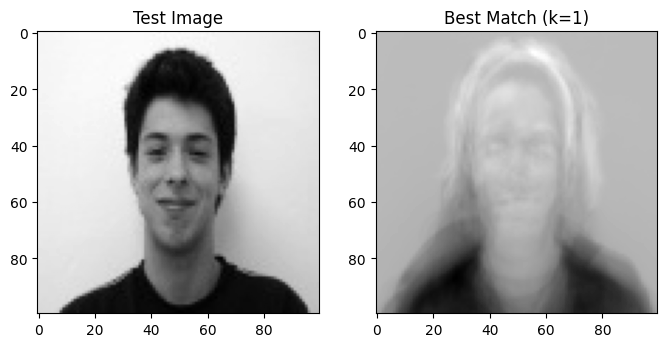

12
17


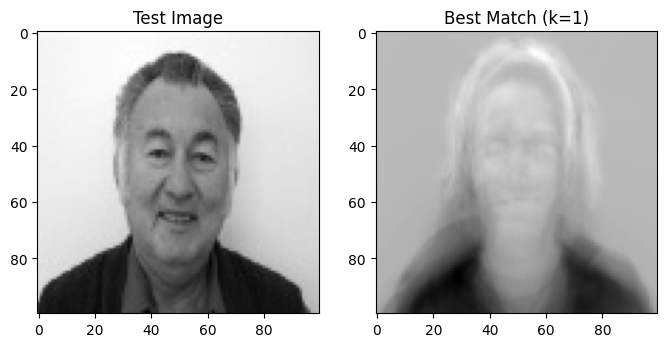

13
17


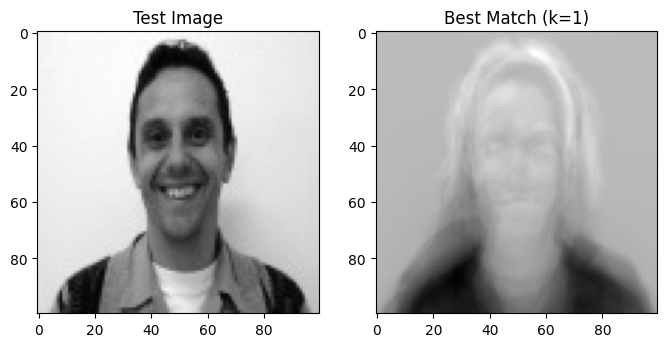

14
17


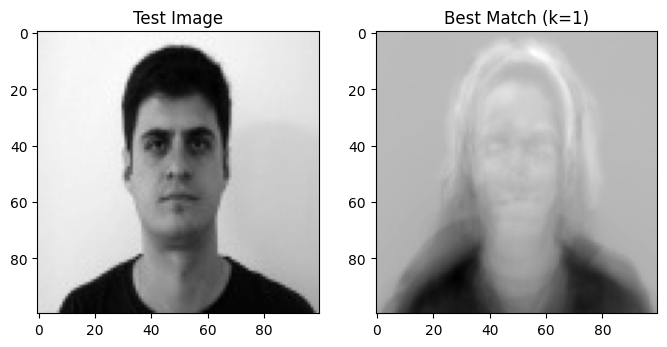

14
18


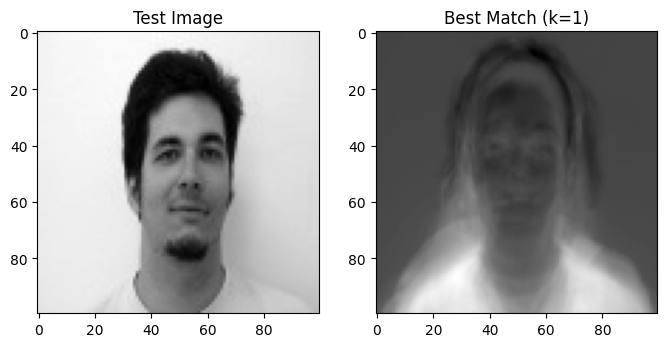

15
18
[0.5454545454545454]


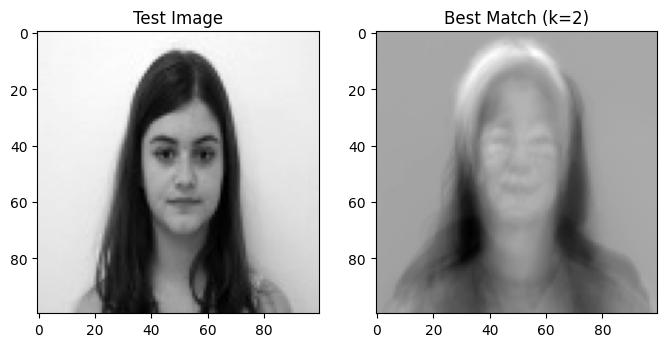

0
1


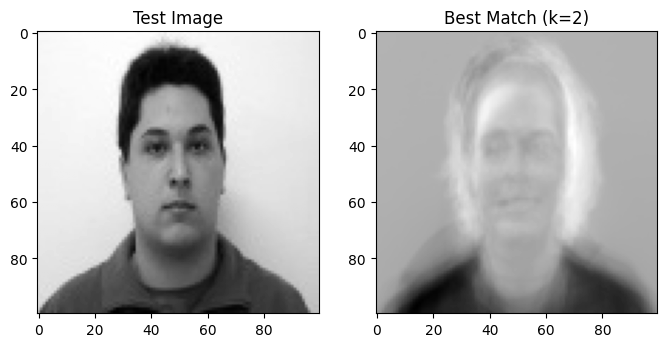

1
1


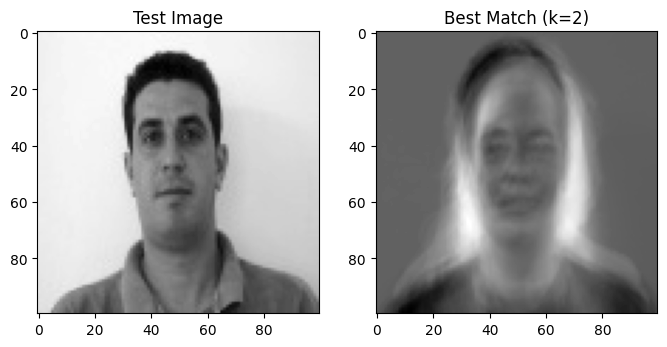

1
2


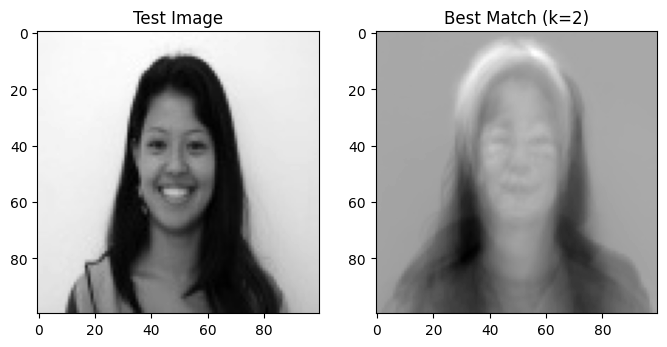

2
2


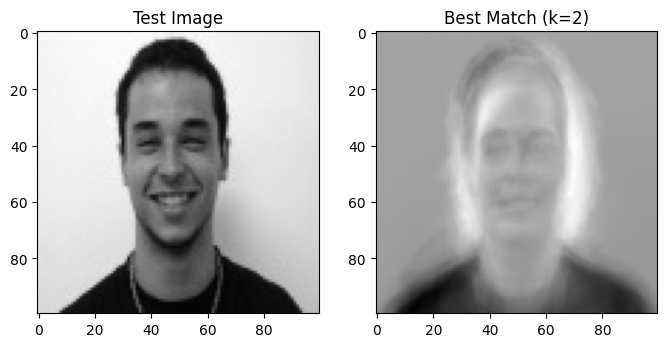

2
3


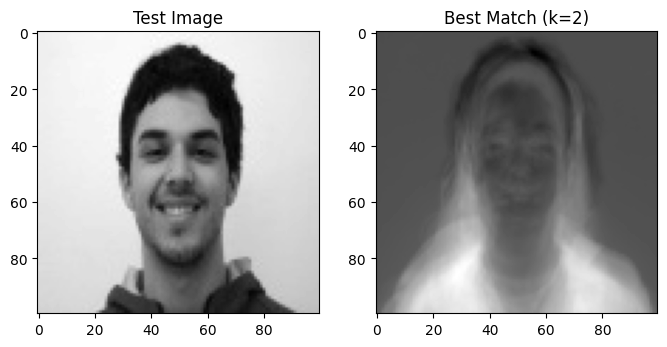

2
4


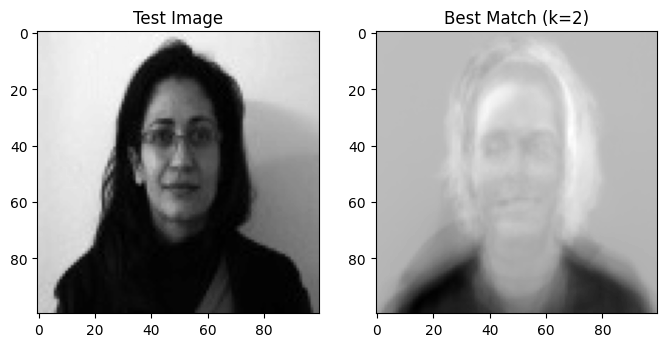

2
5


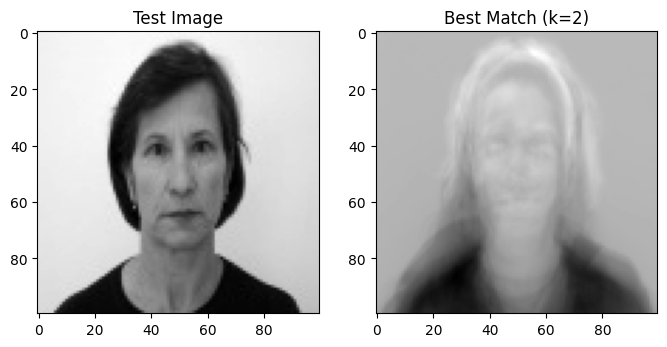

3
5


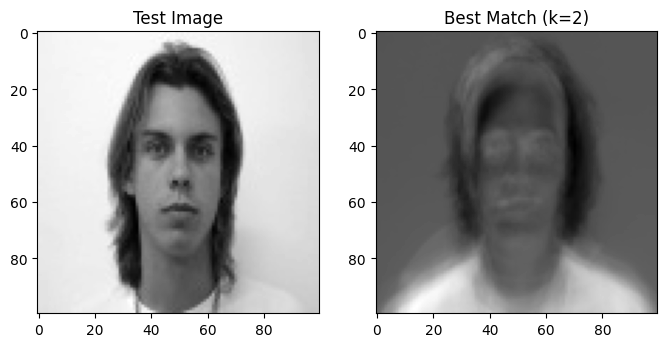

4
5


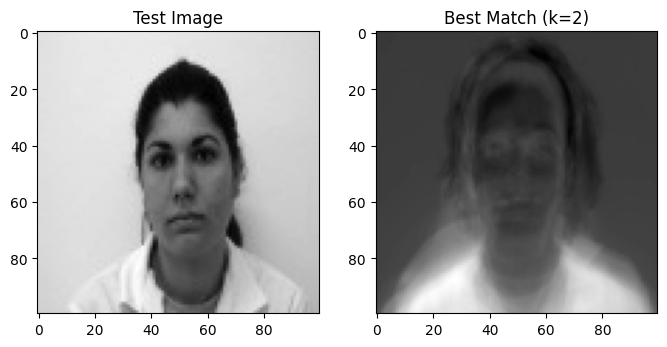

4
6


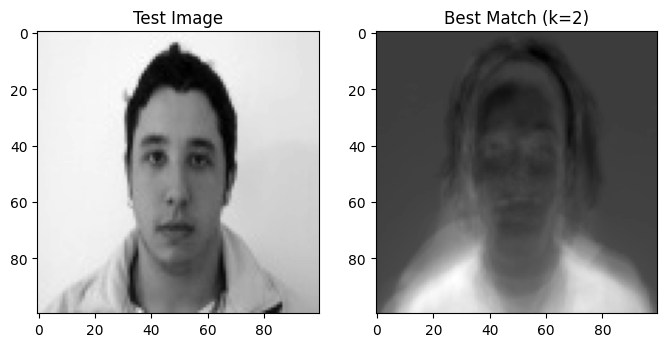

5
6


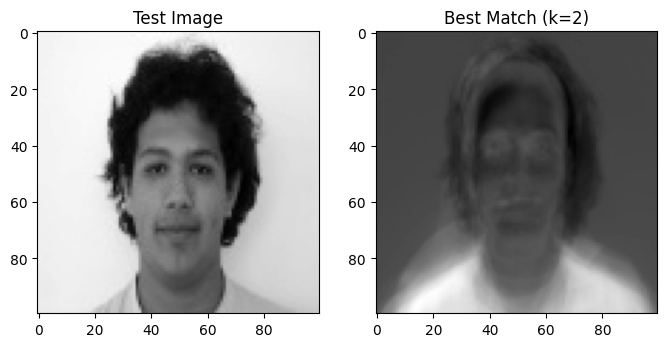

6
6


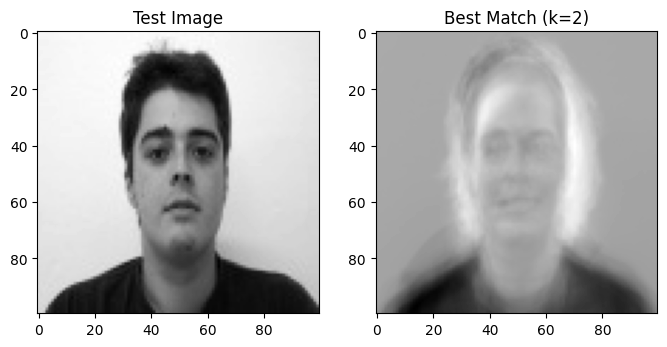

7
6


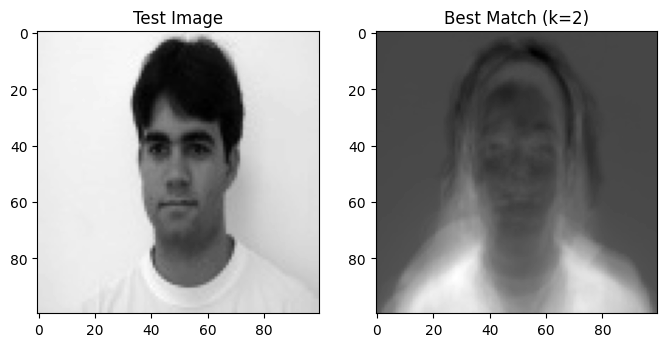

7
7


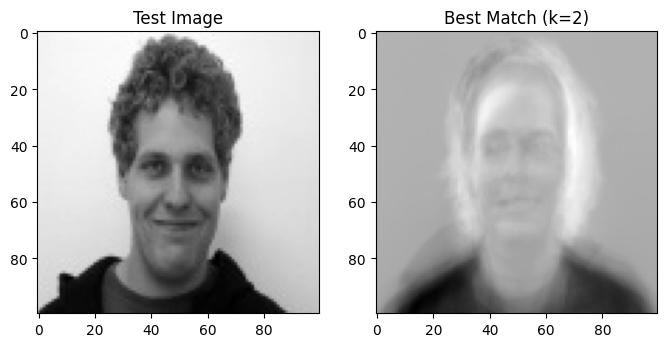

8
7


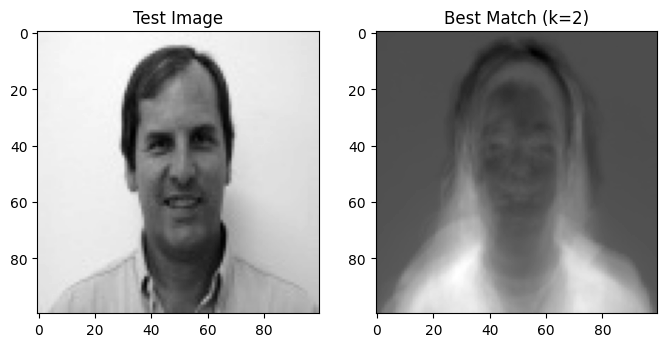

9
7


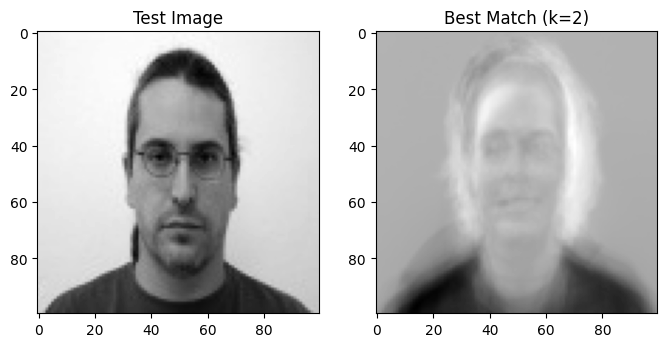

9
8


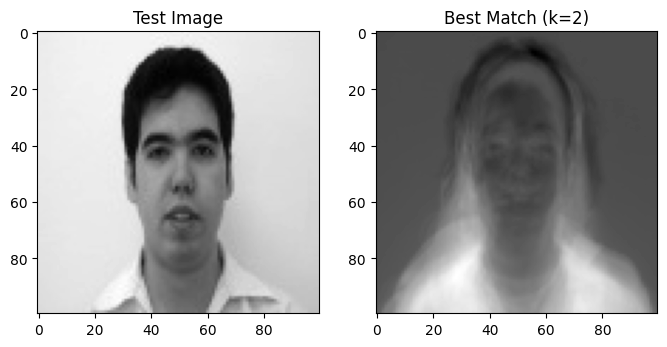

10
8


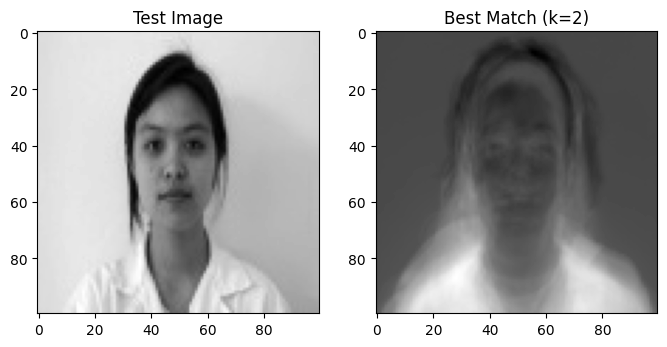

10
9


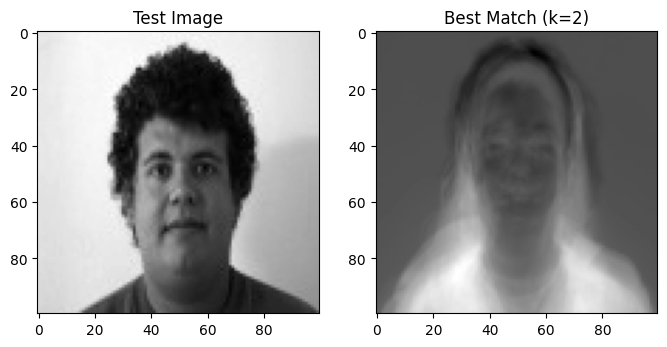

10
10


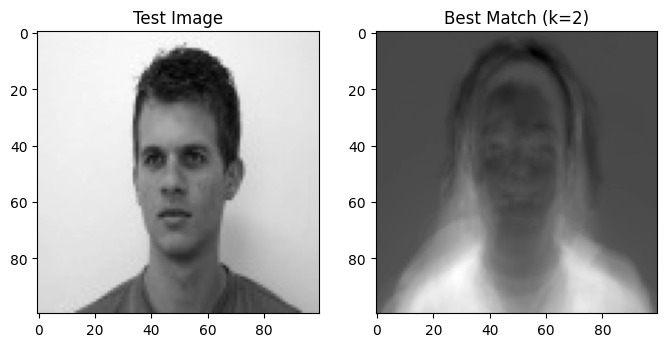

10
11


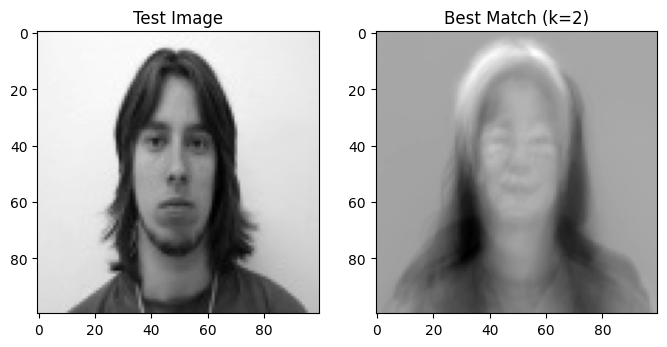

11
11


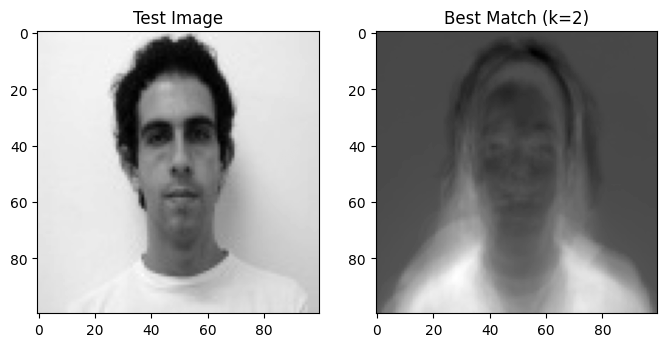

12
11


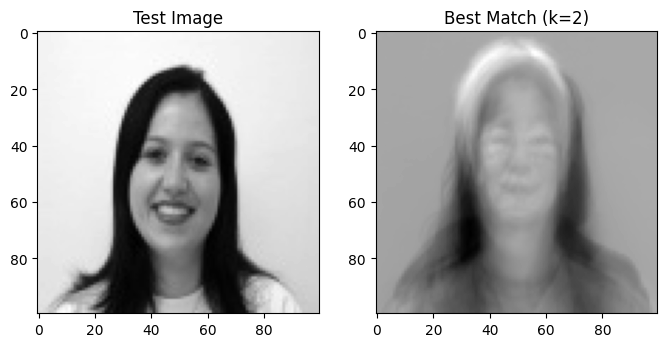

12
12


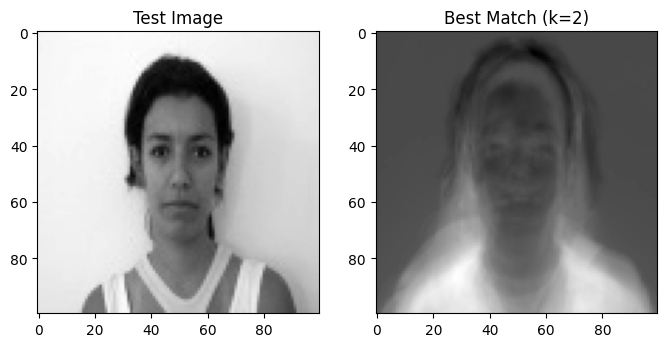

13
12


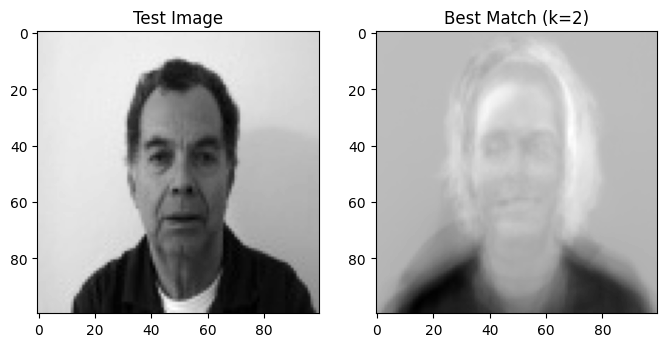

13
13


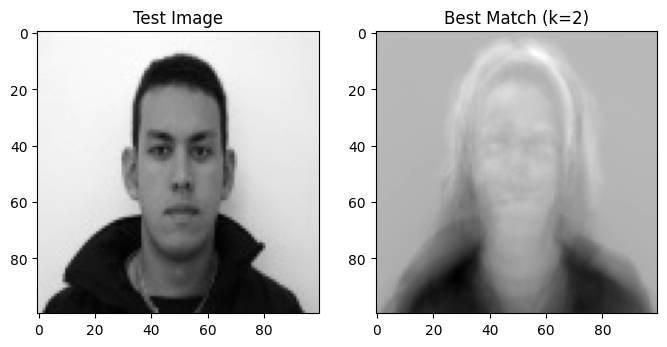

14
13


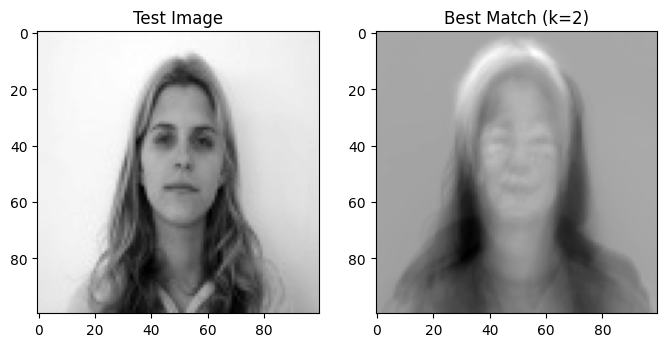

15
13


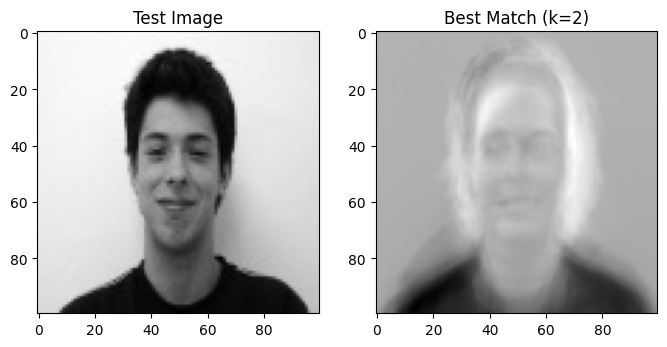

15
14


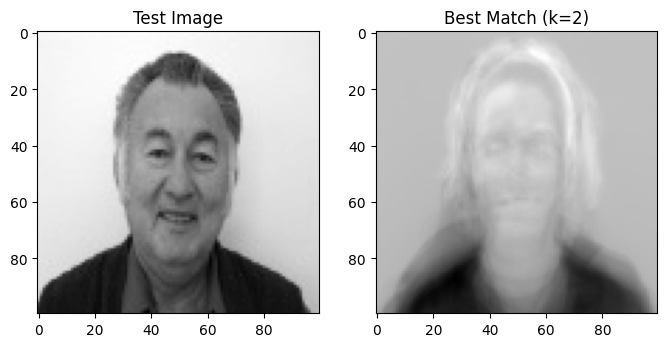

16
14


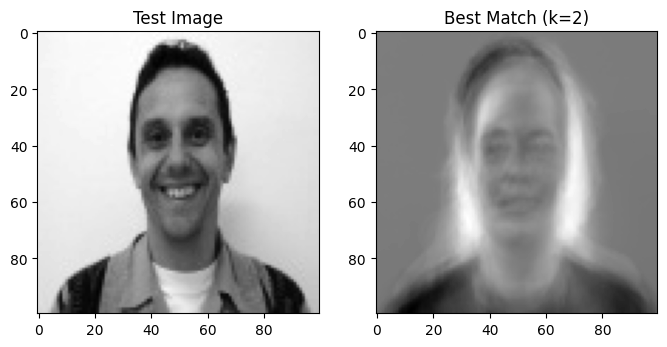

17
14


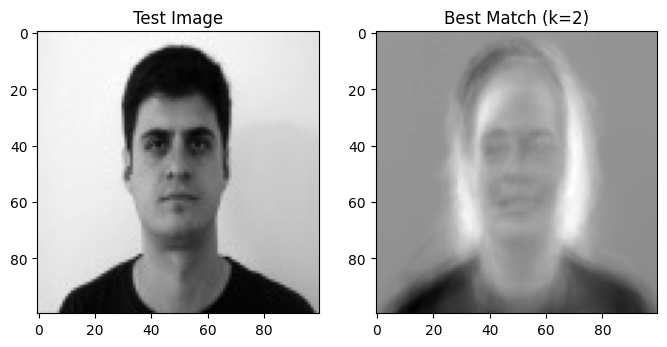

17
15


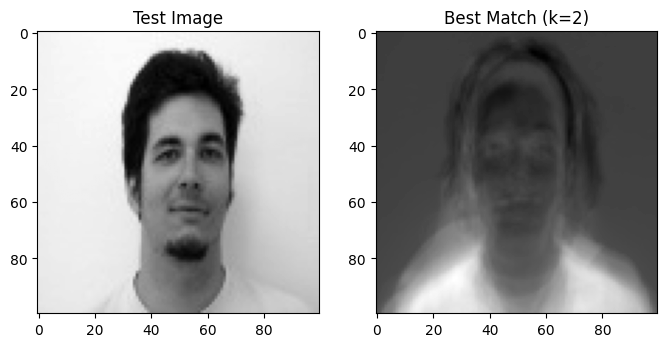

18
15
[0.5454545454545454, 0.45454545454545453]


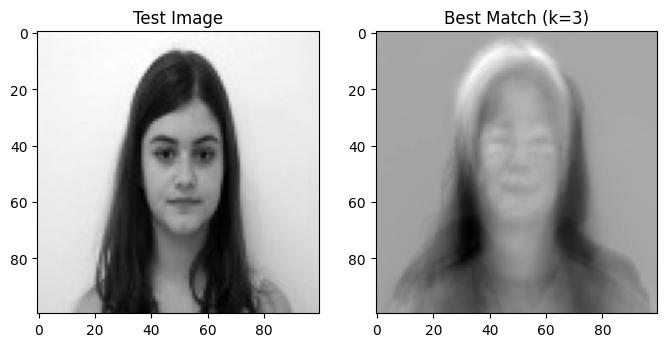

0
1


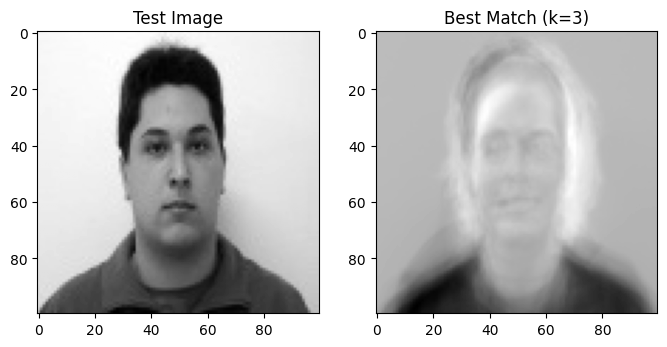

1
1


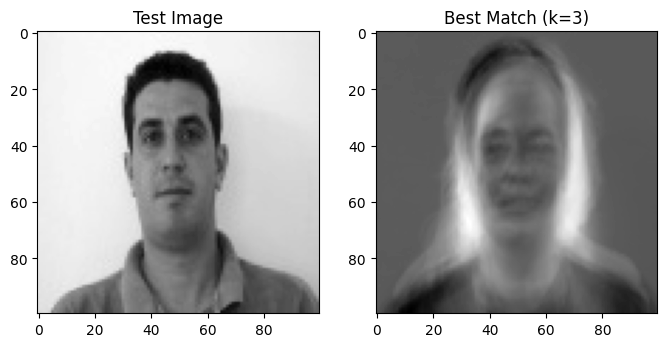

1
2


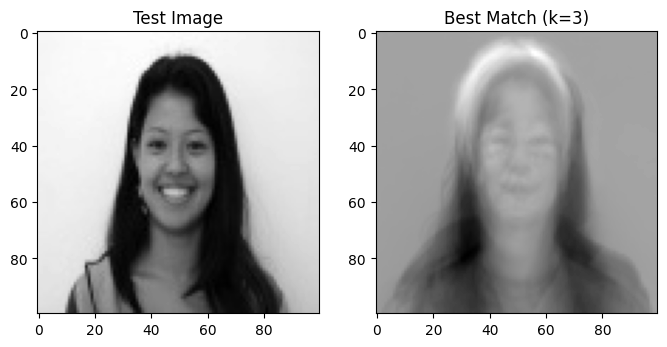

2
2


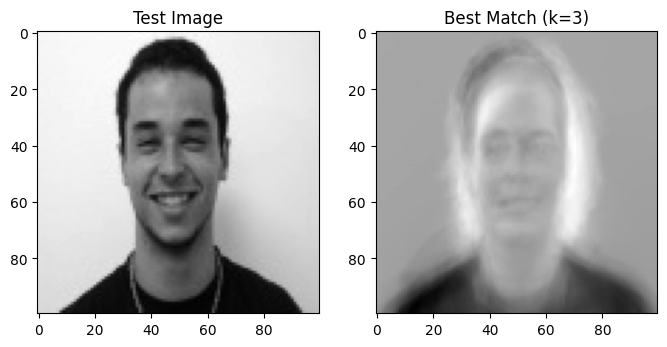

2
3


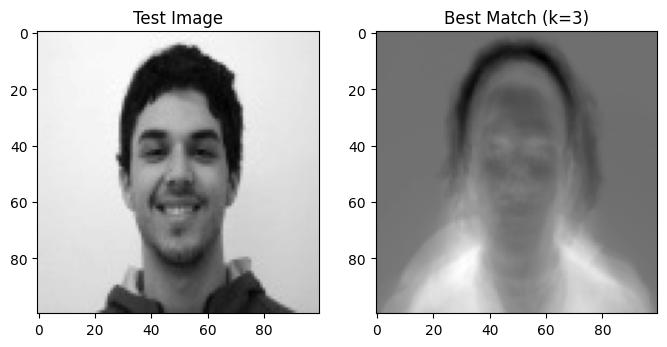

3
3


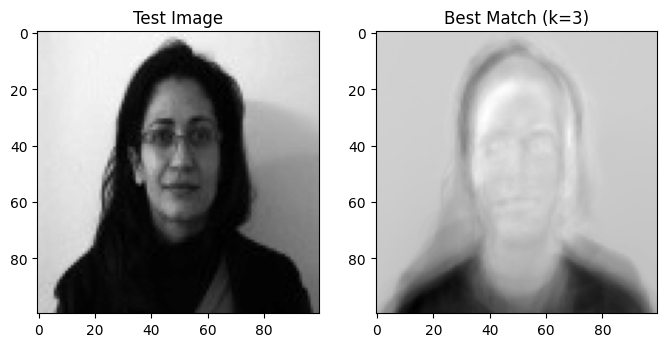

3
4


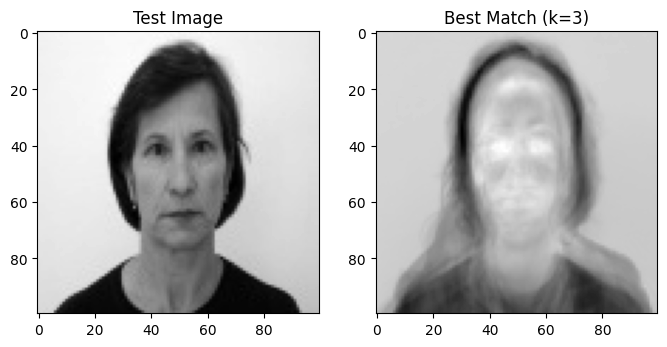

4
4


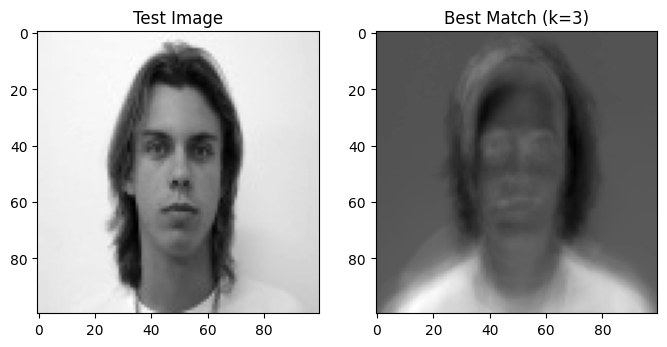

5
4


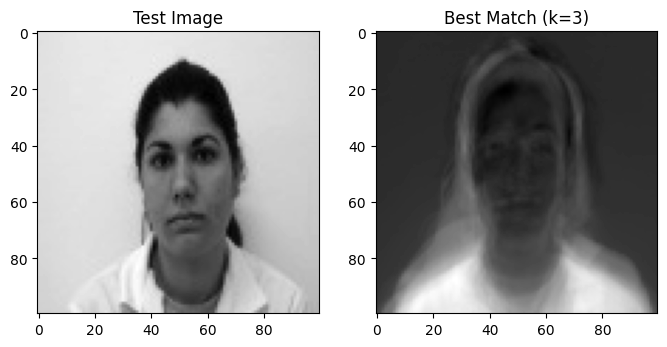

6
4


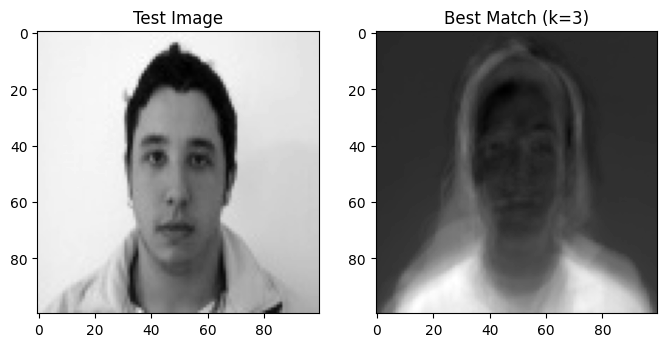

7
4


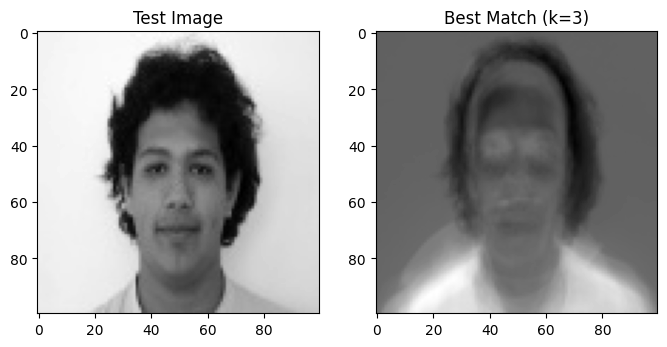

8
4


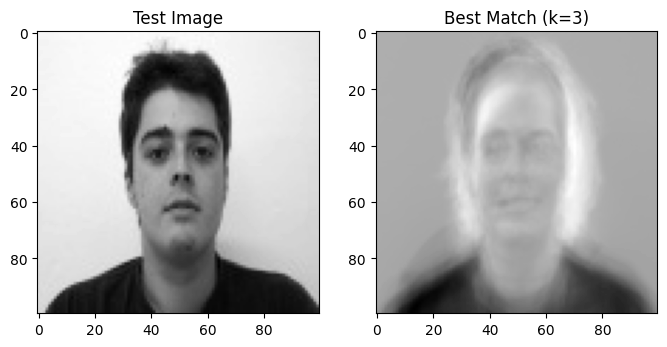

9
4


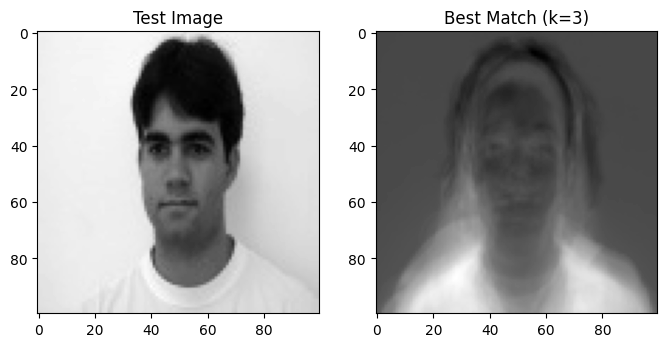

9
5


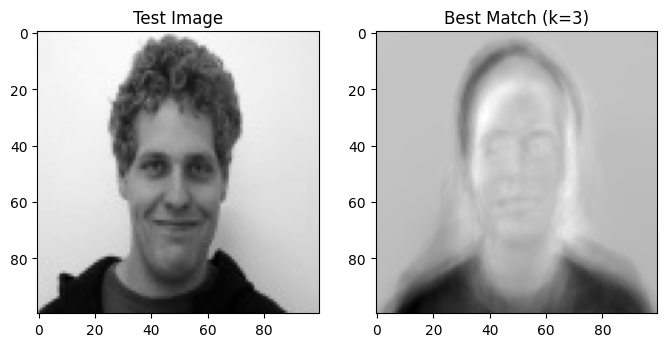

10
5


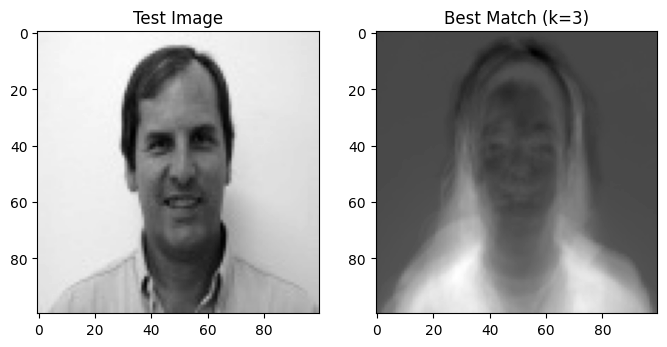

11
5


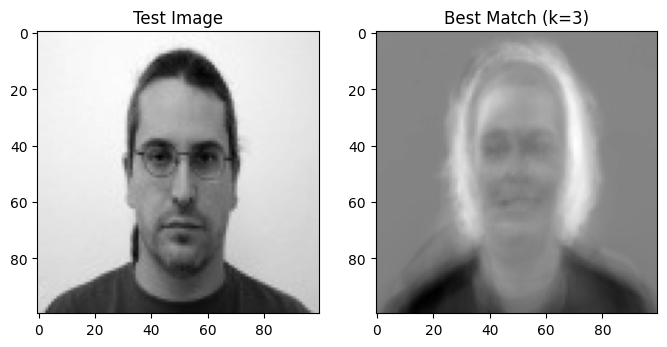

12
5


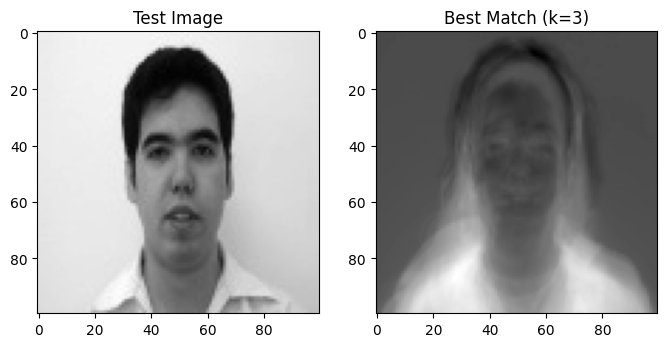

13
5


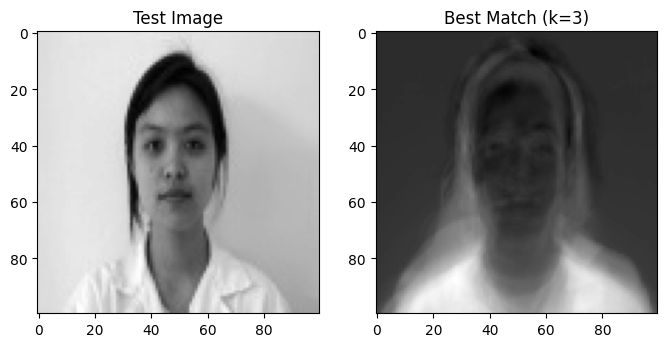

14
5


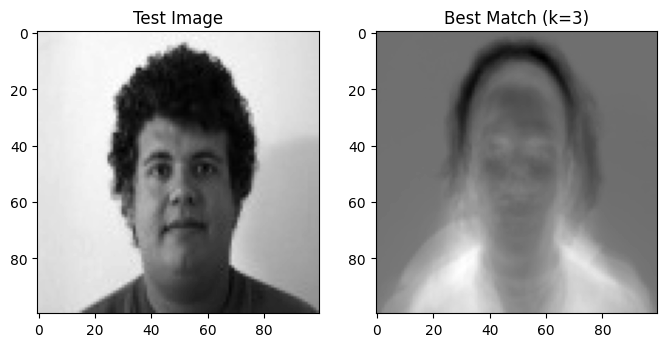

14
6


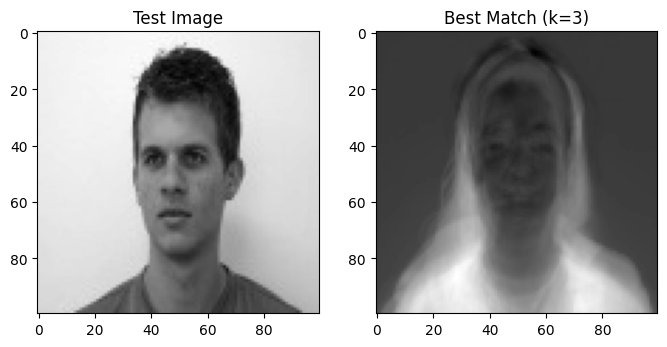

15
6


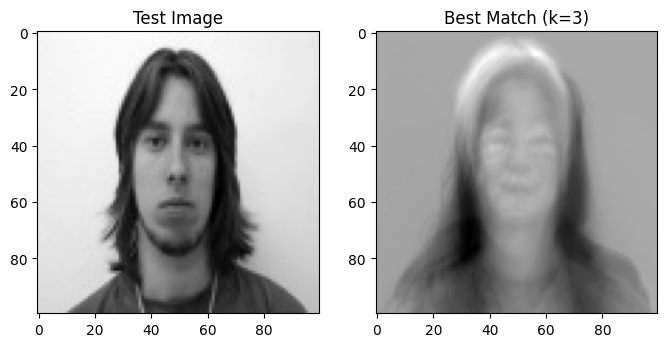

16
6


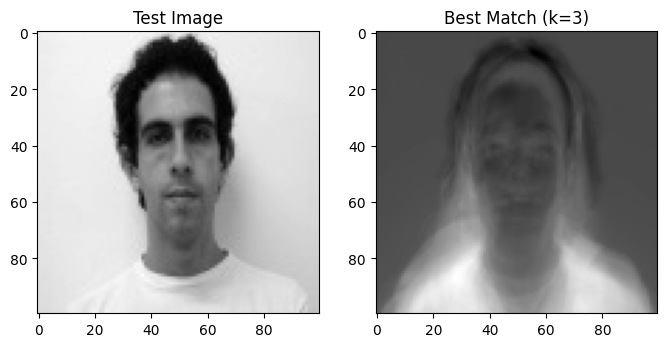

17
6


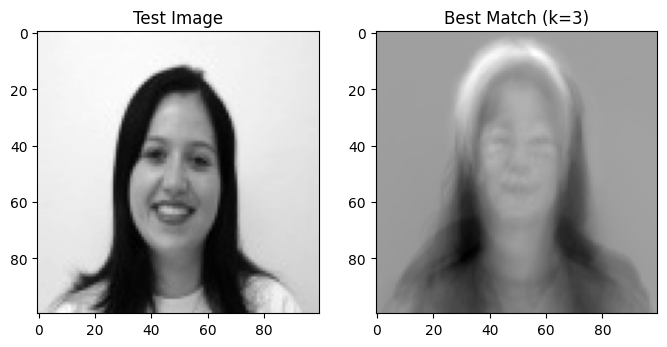

17
7


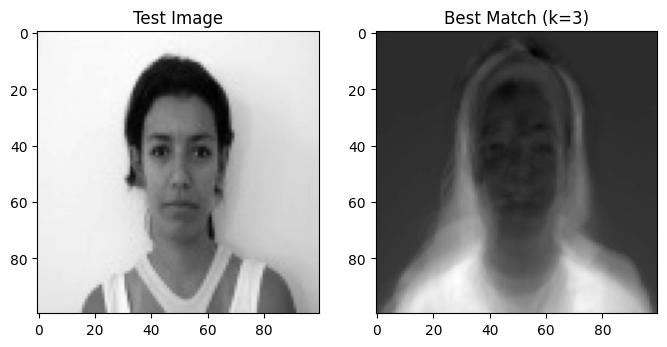

18
7


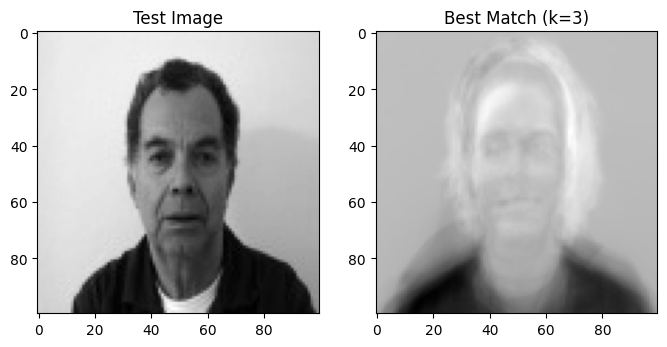

18
8


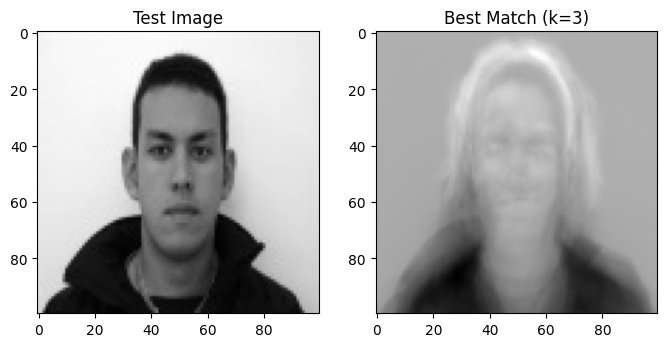

19
8


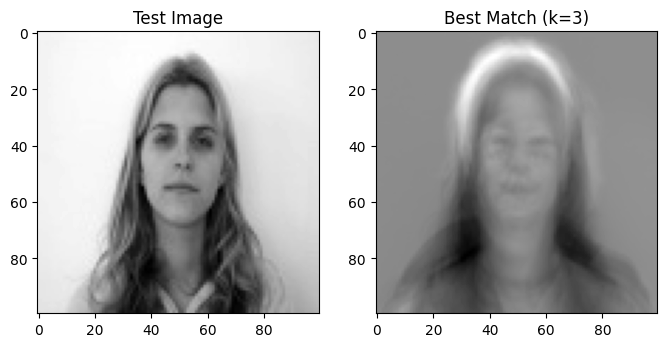

20
8


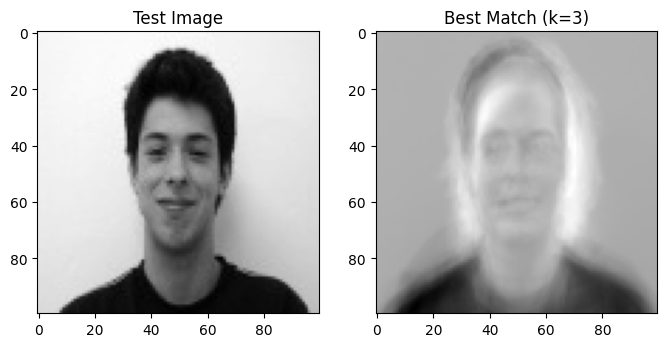

21
8


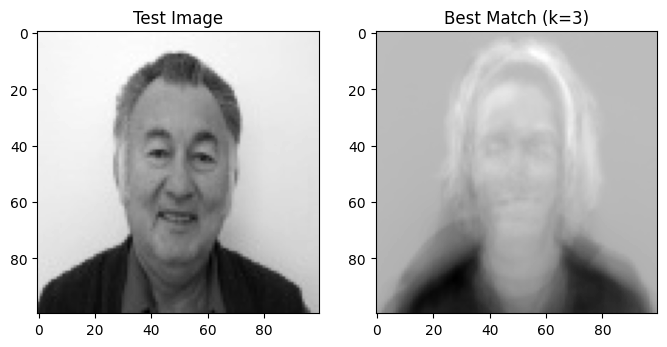

22
8


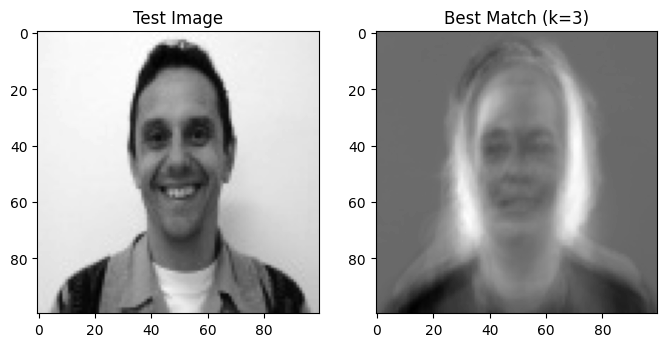

23
8


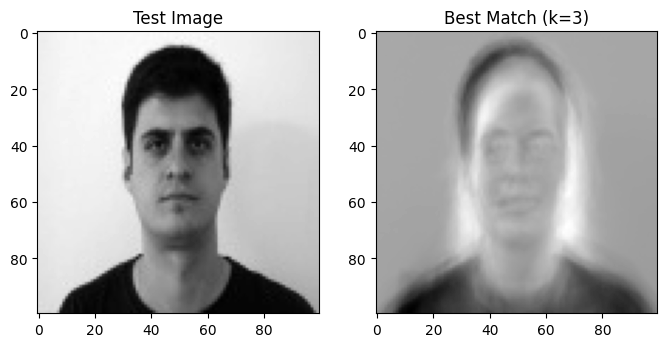

23
9


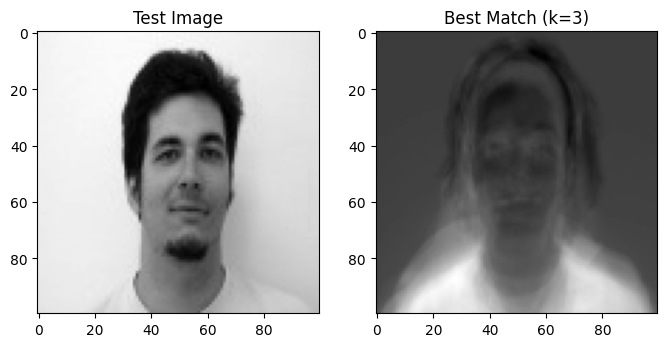

24
9
[0.5454545454545454, 0.45454545454545453, 0.2727272727272727]
{1: 0.45454545454545453, 2: 0.5454545454545454, 3: 0.7272727272727273}


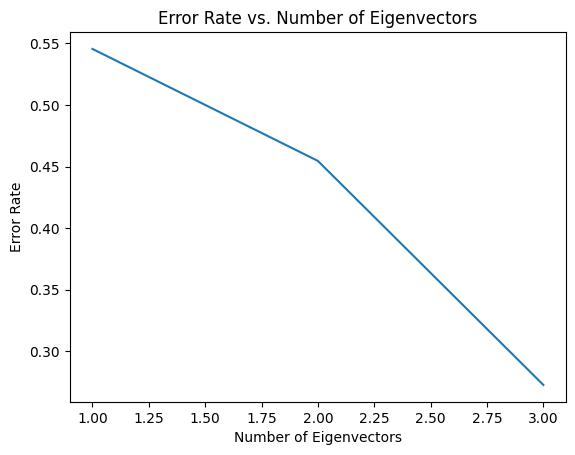

In [1]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt

def svd(A):
    ATA = np.dot(A.T, A)
    eigenValues, eigenVectors = np.linalg.eig(ATA)
    sorted_indices_ATA = np.argsort(eigenValues)[::-1]
    eigenValues = eigenValues[sorted_indices_ATA]
    Sigma = np.sqrt(eigenValues)
    return Sigma


def loadingImages(directory):
    images = []
    ids = []
    for filename in os.listdir(directory):
        idOFImage = filename.split('-')[0]
        if filename.endswith(".jpg") and idOFImage not in ids:
            img = cv2.imread(os.path.join(directory, filename), cv2.IMREAD_GRAYSCALE)
            images.append(img)
            ids.append(idOFImage)
    return images


def plotingImages(images, title):
    rows = 5
    columns = 5
    fig, axes = plt.subplots(rows, columns, figsize=(15, 15))
    fig.suptitle(title, fontsize=16)
    for i, ax in enumerate(axes.flat):
        if i < len(images):
            ax.imshow(images[i], cmap='gray')
            ax.axis('off')
        else:
            ax.axis('off')
    plt.show()

def loadingImageAndSVD(directory):
    SVDData = {}
    images = {}
    for filename in os.listdir(directory):
        if filename.endswith(".jpg"):
            id =  filename.split('-')[0]
            indexOfImage =  filename.split('-')[1].split('.')[0]
            img = cv2.imread(os.path.join(directory, filename), cv2.IMREAD_GRAYSCALE)
            img = img.astype(np.float64)
            S = svd(img)
            if id not in SVDData:
                SVDData[id] = []
                images[id] = []
            SVDData[id].append((int(indexOfImage), S))
            images[id].append((int(indexOfImage), img))
    return SVDData, images


def getFilesofDirectory(directory):
    all_files = []
    for entry in os.listdir(directory):
        full_path = os.path.join(directory, entry)
        if os.path.isfile(full_path):
            all_files.append(full_path)
    return all_files

def calculateMeanFaces(images):
    mean_faces = {}
    for id, img_list in images.items():
        all_images = []
        for index, img in img_list:
            all_images.append(img.flatten())
        mean_face = np.mean(all_images, axis=0)
        mean_faces[id] = mean_face.reshape(img_list[0][1].shape)
    return mean_faces

def pca(images, mean_face, k):
    all_images = []
    for id, img_list in images.items():
        for index, img in img_list:
            all_images.append(img.flatten() - mean_face.flatten())
    A = np.array(all_images).T
    C = np.dot(A.T, A) / (A.shape[1] - 1)
    eigvals, eigvecs = np.linalg.eig(C)
    sorted_indices = np.argsort(eigvals)[::-1]
    eigvecs = eigvecs[:, sorted_indices]
    eigenfaces = np.dot(A, eigvecs[:, :k])
    return eigenfaces

def reconstructingFace(face, mean_face, eigenfaces):
    weights = np.dot(eigenfaces.T, face.flatten() - mean_face.flatten())
    reconstruction = mean_face.flatten() + np.dot(eigenfaces, weights)
    return reconstruction.reshape(mean_face.shape)

def distanceOfSingularValues(S1, S2):
    x = np.linalg.norm(S1 - S2)
    return x

def plotForError(error_rates, k_values):
    plt.plot(k_values, error_rates)
    plt.xlabel('Number of Eigenvectors')
    plt.ylabel('Error Rate')
    plt.title('Eror Rate vs . Number OF Eigenvectors')
    plt.show()

directory_path = '/Users/arasvalizadeh/Downloads/CQ1/Dataset'
SVDData, images = loadingImageAndSVD(directory_path)
testset_path = '/Users/arasvalizadeh/Downloads/CQ1/Testset'  
test_files = getFilesofDirectory(testset_path)

mean_faces = calculateMeanFaces(images)
originalImages = loadingImages(directory_path)
mean_faces_list = [mean_faces[id] for id in mean_faces]  
k_values = [1,2,3,5,10]
error_rates = []
#plotingImages(originalImages, title="Original Faces")
#plotingImages(mean_faces_list, title="Mean Faces")
flattened_faces = []
for mean_face in mean_faces.values():
    flattened_faces.append(mean_face.flatten())
mean_flattened_face = np.mean(flattened_faces, axis=0)
first_face_shape = next(iter(mean_faces.values())).shape
global_mean_face = mean_flattened_face.reshape(first_face_shape)
correctness = {}
for k in k_values:
    eigenfaces = pca(images, global_mean_face, k)
    errors = 0
    correct = 0
    for test_image_path in test_files:
        test_id = test_image_path.split('/')[-1].split('-')[0]
        test_image = cv2.imread(test_image_path, cv2.IMREAD_GRAYSCALE)
        test_image = test_image.astype(np.float64)
        test_image_reconstructed = reconstructingFace(test_image, global_mean_face, eigenfaces)
        distances = []
        for id, img_list in images.items():
            for index, img in img_list:
                img_reconstructed = reconstructingFace(img, global_mean_face, eigenfaces)
                distance = distanceOfSingularValues(test_image_reconstructed, img_reconstructed)
                distances.append((id, index, distance, img_reconstructed))
        distances = sorted(distances, key=lambda x: x[2])
        best_match_id = distances[0][0]
        best_match_img = distances[0][3]       
                
        plt.figure(figsize=(8, 4))
        plt.subplot(1, 2, 1)
        plt.title('Test Image')
        plt.imshow(test_image, cmap='gray')
        plt.subplot(1, 2, 2)
        plt.title(f'Best Match (k={k})')
        plt.imshow(best_match_img, cmap='gray')
        plt.show() 
        
        if test_id != best_match_id:
            errors += 1
        else :
            correct += 1
        print(correct)
        print(errors)
    error_rate = errors / (len(test_files))
    error_rates.append(error_rate)
    correctness[k] = correct / (len(test_files))
    print(error_rates)
print(correctness)
plotForError(error_rates, k_values)


Q1-C

در مجموع سرعت روش پی سی ای بخاطر کوچک کردن ماتریس های بزرگ بیشتر از روش اس وی دی است. این در حالی است که این روش فقط بر روی ماتریس ها ی مربعی کارا است ولی در روش اس وی دی ما هر ماتریسی با هر شکلی داشته باشیم میتوانیم آن را تجزیه کنیم و همین ویژگی باعث میشود که این روش انعطاف پذیری زیادی داشته باشد. اما وقتی تعداد عکس ها زیاد شود ما مجبوریم که تعداد زیادی تجزیه ی اس وی دی انجام دهیم که همین کار باعث میشود که سرعت این روش کم شود. این درحالی است که چون درر روش پی سی ای ما فقط با ماتریس ها ی کوواریانس کار میکنیم تعداد محاسبات ما کم میشود و سرعت هم بهتر میشود. پس به طور کلی میتوان گفت که برای داده ها بیشتر تر بهتر است ما از روش پی سی ای استفاده کنیم و اگر داده های ما به فرم مربعی نیستند از روش اس وی دی استفاده کنیم.